In [1]:
import os
import json
import glob
from src.models.run_detection import load_model, run_detection
from src.visualization.visu import merge_images, visualise_model_out, get_detections_times_and_freqs

In [2]:
mod_p = r'..\models\detr_noneg_100q_bs20_r50dc5'
model, config = load_model(mod_p)

In [3]:
### Load bird id dictionary

# Bird dict
dict_dir = r'../src/models/'
with open(os.path.join(dict_dir, 'bird_dict.json'), 'r') as f:
    birds_dict = json.load(f)

birds_dict.update({'Non bird sound': 0})
reverse_dict = {id: bird_name for bird_name, id in birds_dict.items()}

In [4]:
##
test_dirp = r'../data/external/tests/audio_samples/'
##

In [5]:
glob.glob(test_dirp)

['../data/external/tests/test2/']

In [6]:
wav_f_p = glob.glob(os.path.join(test_dirp, '*.wav'))
t_filep = wav_f_p[0]

In [7]:
#### Exec model
fp, outputs, spectrogram = run_detection(model, config, t_filep, return_spectrogram=True)

100%|██████████| 24/24 [00:18<00:00,  1.32it/s]


1


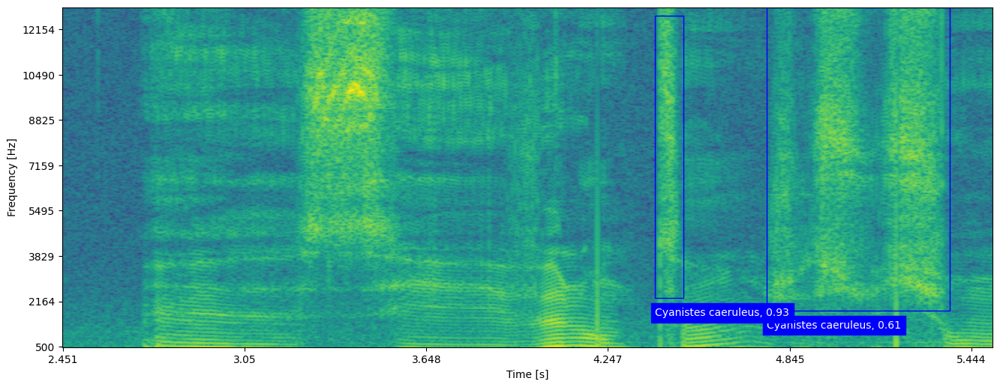

2


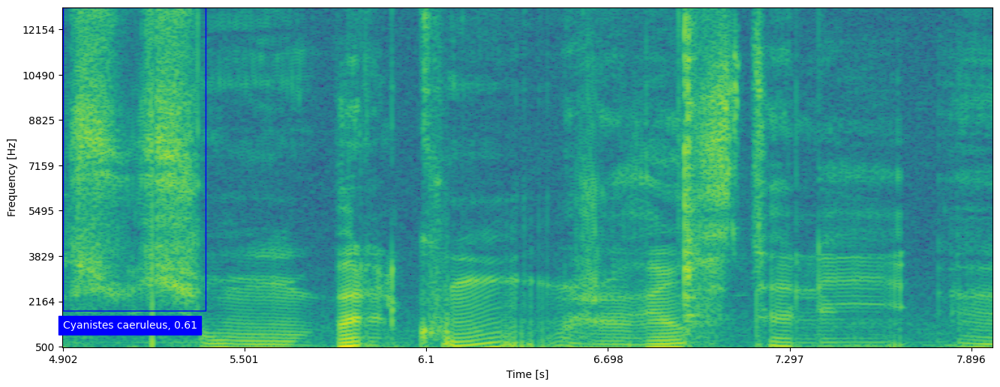

7


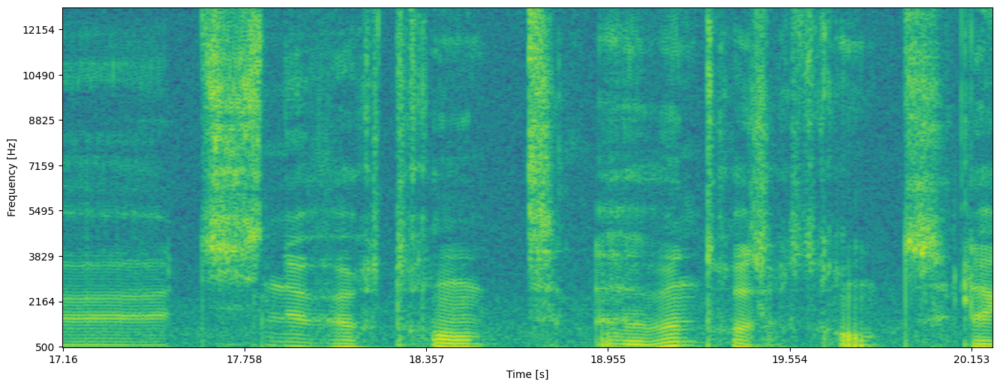

11


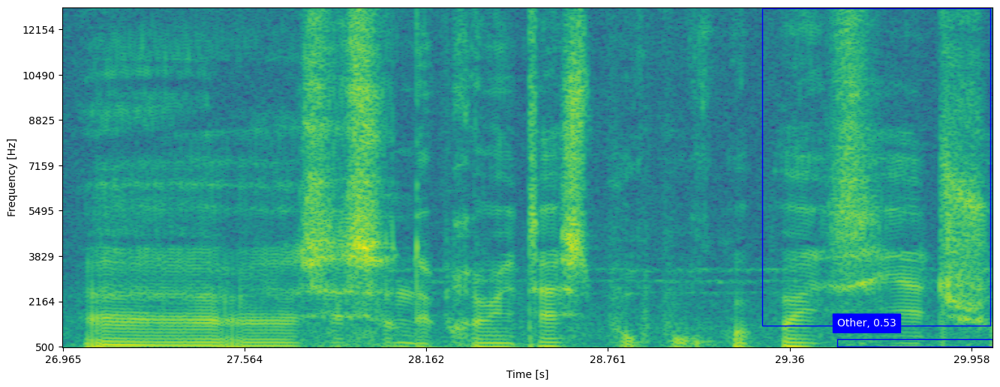

12


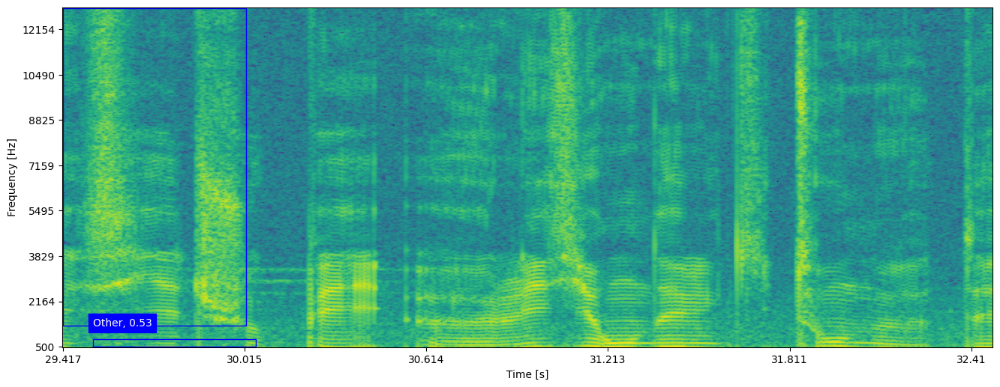

15


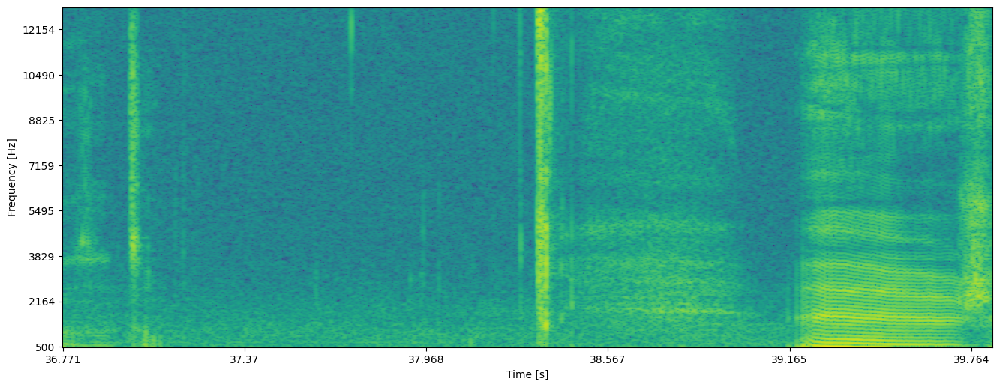

20


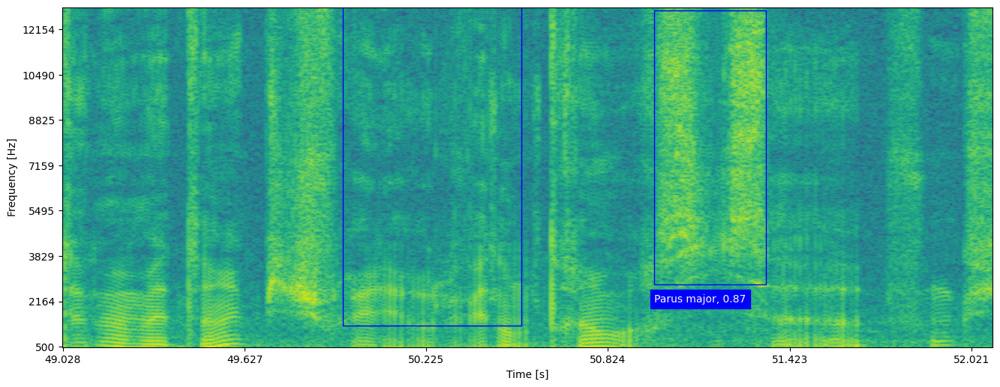

22


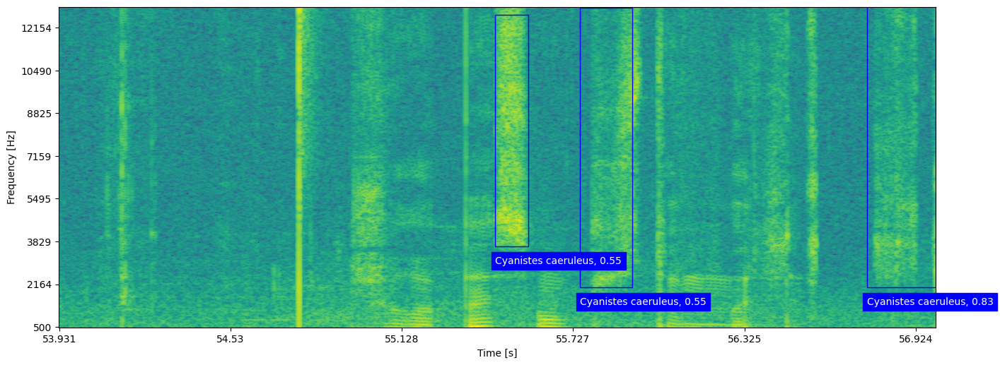

23


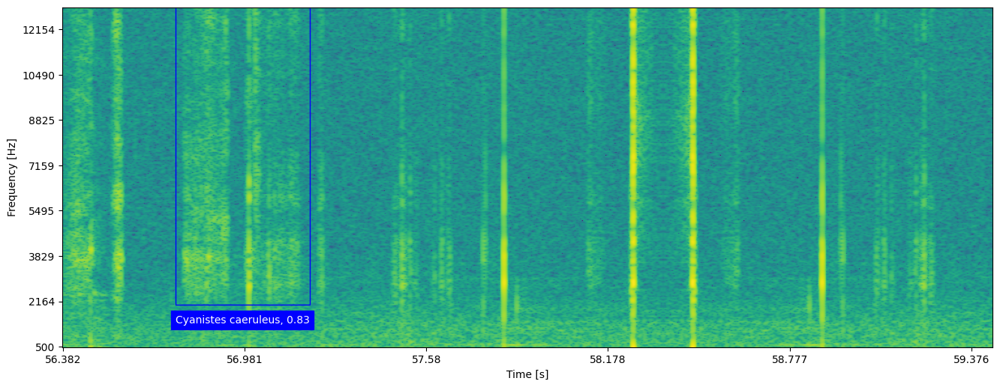

In [8]:
### Visualisation des résultats
class_bbox = merge_images(fp, outputs, config.num_classes)
output = {reverse_dict[idx]: {key: value.cpu().numpy().tolist() for key, value in class_bbox[str(idx)].items()} for idx in range(1, len(class_bbox) + 1) if len(class_bbox[str(idx)]['bbox_coord']) > 0}
visualise_model_out(output, fp, spectrogram, reverse_dict)

In [10]:
lines = get_detections_times_and_freqs(output, fp, spectrogram, reverse_dict)
lines

['4.771156462585035\t5.372789115646259\tCyanistes caeruleus\n\\\t1332.0\t12454.199999999999\n',
 '4.402993197278912\t4.49578231292517\tCyanistes caeruleus\n\\\t1798.1999999999998\t12154.499999999998\n',
 '4.902857142857143\t5.372789115646259\tCyanistes caeruleus\n\\\t1332.0\t12454.199999999999\n',
 '29.27047619047619\t30.021768707482995\tParus major\n\\\t765.9\t12420.9\n',
 '29.51591836734694\t30.027755102040818\tOther\n\\\t0.0\t266.4\n',
 '29.41714285714286\t30.021768707482995\tParus major\n\\\t765.9\t12420.9\n',
 '29.51591836734694\t30.05170068027211\tOther\n\\\t0.0\t266.4\n',
 '50.97714285714286\t51.34530612244898\tParus major\n\\\t2297.7\t12354.3\n',
 '49.950476190476195\t50.54013605442177\tParus major\n\\\t765.9\t12554.099999999999\n',
 '55.7512925170068\t55.93387755102041\tCyanistes caeruleus\n\\\t1531.8\t12420.9\n',
 '55.45496598639456\t55.57170068027211\tCyanistes caeruleus\n\\\t3130.2\t12154.499999999998\n',
 '56.75401360544218\t56.993469387755106\tCyanistes caeruleus\n\\\t153

In [15]:
birds_dict

994